In [1]:
    
# --- Imports
import os
import re
import glob
from typing import List, Tuple, Optional, Dict

from PIL import Image
import matplotlib.pyplot as plt


In [2]:

# --- Configuration

# 1) Directory that contains your image folders
# Example: r"C:/Users/you/experiments/lrp_runs" or "/home/you/experiments/lrp_runs"
BASE_DIR = "."

# 2) Folders to include (rows). Put whatever folders you have here.
# They must exist under BASE_DIR, e.g. BASE_DIR/imgs_wb, BASE_DIR/imgs_wb_pruned, ...
FOLDERS = [
    #"imgs_wb",
    
    #"imgs_wb_pruned_wb_linear_0123",
    #"imgs_wb_pruned_wb_linear_1",
    #"imgs_wb_pruned_wb_linear_2",
    #"imgs_wb_pruned_wb_linear_counter_1",
    #"imgs_wb_pruned_wb_linear_counter_2",
    
    #"imgs_wb_pruned_wb_softmax_0123",
    #"imgs_wb_pruned_wb_softmax_1",
    #"imgs_wb_pruned_wb_softmax_2",
    #"imgs_wb_pruned_wb_softmax_counter_1",
    #"imgs_wb_pruned_wb_softmax_counter_2",

    "imgs_isic",

    "imgs_isic_pruned_isic_linear_0123",
    "imgs_isic_pruned_isic_linear_3",
    "imgs_isic_pruned_isic_linear_counter_3"
    
    #"imgs_isic_pruned_isic_softmax_0123",
    #"imgs_isic_pruned_isic_softmax_3",
    #"imgs_isic_pruned_isic_softmax_counter_3"
    
]

# 3) Which group to iterate (e.g., 1 -> matches files that start with 'group-1-...')
GROUP = 3

# 4) Limit how many images to show (None for all)
LIMIT: Optional[int] = 100  # e.g., 20

# 5) Explicitly include only certain IDs (list of the middle part after the group, e.g., [1047, 2031]).
# If None, show all found within GROUP.
INCLUDE_IDS: Optional[List[str]] = None  # e.g., ["1047", "2031"]

# 6) Save each montage as a PNG next to the notebook? (Set OUTPUT_DIR accordingly.)
SAVE_FIGS = False
OUTPUT_DIR = "montages"

# 7) DPI for saved figures
SAVE_DPI = 300


In [3]:

# --- Utilities

STEM_RE = re.compile(r"^(?P<stem>group-(?P<group>\d+)-(?P<id>[^_]+))_(?P<cls>[01])_(?P<flag>[A-Za-z])\.png$")

def collect_stems_for_group(base_dir: str, folders: List[str], group: int,
                            include_ids: Optional[List[str]] = None) -> List[str]:
    """
    Scan provided folders for files matching the GROUP and return a sorted, unique list of stems,
    e.g., ["group-1-1047", "group-1-2001", ...].
    """
    stems = set()
    for folder in folders:
        folder_path = os.path.join(base_dir, folder)
        if not os.path.isdir(folder_path):
            print(f"[WARN] Folder not found (skipping): {folder_path}")
            continue
        # We expect filenames like group-1-<id>_<cls>_<flag>.png
        pattern = os.path.join(folder_path, f"group-{group}-*_[01]_[A-Za-z].png")
        for path in glob.glob(pattern):
            fname = os.path.basename(path)
            m = STEM_RE.match(fname)
            if not m:
                continue
            stem = m.group("stem")
            if include_ids is not None:
                # include_ids are the <id> part after group-x-...
                # Normalize both to strings for comparison
                include_ids_str = set(map(str, include_ids))
                if m.group("id") not in include_ids_str:
                    continue
            stems.add(stem)
    # Sort stems by the trailing id if numeric; else lexicographically
    def stem_key(s: str):
        # s looks like "group-<group>-<id>"
        try:
            _id = s.split("-", 2)[-1]
            return (0, int(_id))
        except Exception:
            return (1, s)
    return sorted(stems, key=stem_key)


def find_image(base_dir: str, folder: str, stem: str, cls: int) -> Tuple[Optional[str], Optional[str]]:
    """
    Return (path, flag) for the first matching file for given stem & class.
    Matches group-<g>-<id>_<cls>_<flag>.png where <flag> is a single letter.
    """
    folder_path = os.path.join(base_dir, folder)
    # Any single-letter flag
    candidates = glob.glob(os.path.join(folder_path, f"{stem}_{cls}_[A-Za-z].png"))
    if not candidates:
        # Fallback: allow '?' wildcard if your flags include non-letters by accident
        candidates = glob.glob(os.path.join(folder_path, f"{stem}_{cls}_?.png"))
    if not candidates:
        return None, None
    # Choose the first (sorted for determinism)
    candidates.sort()
    path = candidates[0]
    fname = os.path.basename(path)
    m = STEM_RE.match(fname)
    flag = m.group("flag") if m else None
    return path, flag



def show_montage_for_stem(base_dir: str, folders: List[str], stem: str,
                          classes: List[int] = [0, 1],
                          save_figs: bool = False,
                          output_dir: Optional[str] = None,
                          save_dpi: int = 150):
    nrows = len(classes)  # typically 2
    ncols = len(folders)

    # Smaller per-cell size + many columns fit on screen
    fig_w = 2.6 * ncols
    fig_h = 1.8 * nrows
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_w, fig_h))

    # Ensure axes is 2D for consistent indexing
    if nrows == 1 and ncols == 1:
        axes = [[axes]]
    elif nrows == 1:
        axes = [axes]
    elif ncols == 1:
        axes = [[ax] for ax in axes]

    for r, cls in enumerate(classes):
        for c, folder in enumerate(folders):
            ax = axes[r][c]
            path, flag = find_image(base_dir, folder, stem, cls)
            title_suffix = f" cls{cls} " + (f"flag {flag}" if flag else "")
            if path and os.path.exists(path):
                try:
                    im = Image.open(path)
                    ax.imshow(im)
                except Exception as e:
                    ax.text(0.5, 0.5, f"Error loading\n{os.path.basename(path)}\n{e}",
                            ha="center", va="center", fontsize=8)
            else:
                ax.text(0.5, 0.5, f"Missing:\n{folder}\n{stem}_{cls}_?.png",
                        ha="center", va="center", fontsize=8)
            ax.set_title(f"{folder}\n{title_suffix}", fontsize=9, pad=2)
            ax.axis("off")

        # Left-edge label with class name (small pad so it's snug)
        axes[r][0].set_ylabel(f"class {cls}", rotation=90, labelpad=4,
                              va="center", fontsize=9)

    fig.suptitle(stem, fontsize=11, y=0.97)

    # Tighter spacing: minimal margins + very small inter-subplot padding
    fig.subplots_adjust(left=0.01, right=0.99, bottom=0.03, top=0.92,
                        wspace=0.02, hspace=0.02)

    if save_figs and output_dir:
        os.makedirs(output_dir, exist_ok=True)
        out_path = os.path.join(output_dir, f"{stem}_montage.png")
        fig.savefig(out_path, dpi=save_dpi)
        print(f"[Saved] {out_path}")
    plt.show()



def run_viewer(base_dir: str, folders: List[str], group: int,
               include_ids: Optional[List[str]] = None,
               limit: Optional[int] = None,
               save_figs: bool = False,
               output_dir: Optional[str] = None,
               save_dpi: int = 150):
    stems = collect_stems_for_group(base_dir, folders, group, include_ids=include_ids)
    if not stems:
        print(f"No stems found for group-{group} in provided folders.")
        return
    if limit is not None:
        stems = stems[:limit]

    print(f"Found {len(stems)} image(s) for group-{group}. Rendering...")
    for stem in stems:
        show_montage_for_stem(base_dir, folders, stem, save_figs=save_figs,
                              output_dir=output_dir, save_dpi=save_dpi)


Found 50 image(s) for group-3. Rendering...


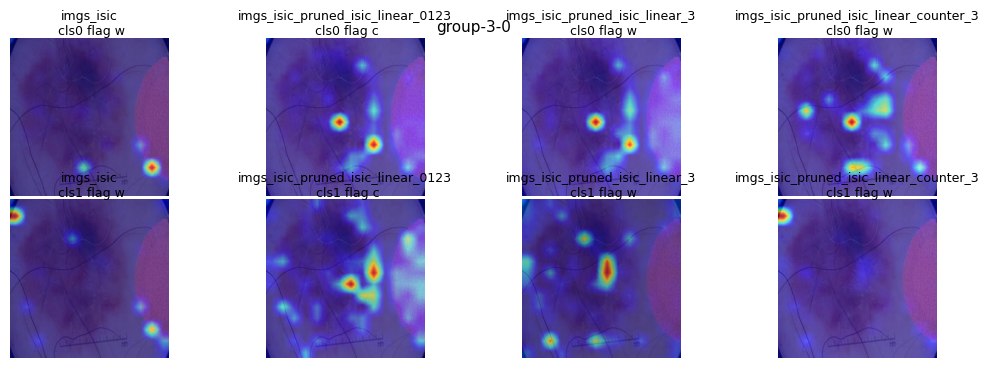

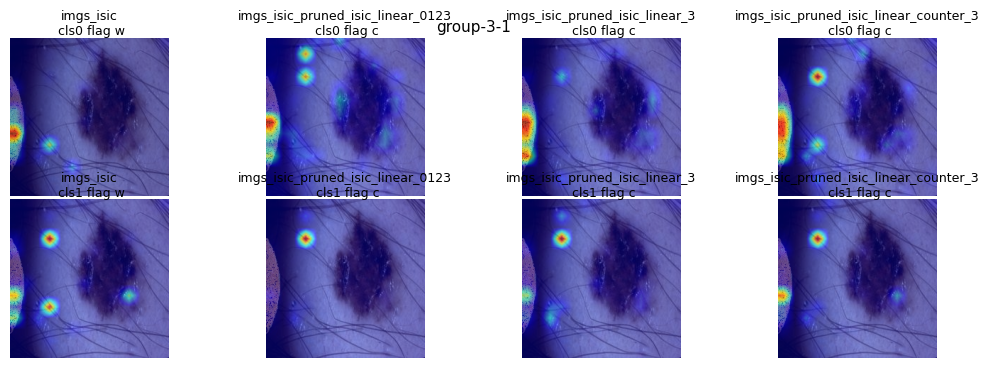

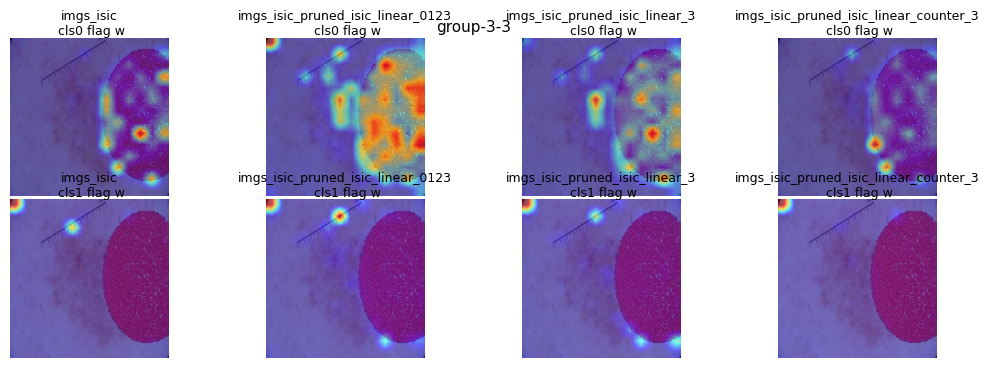

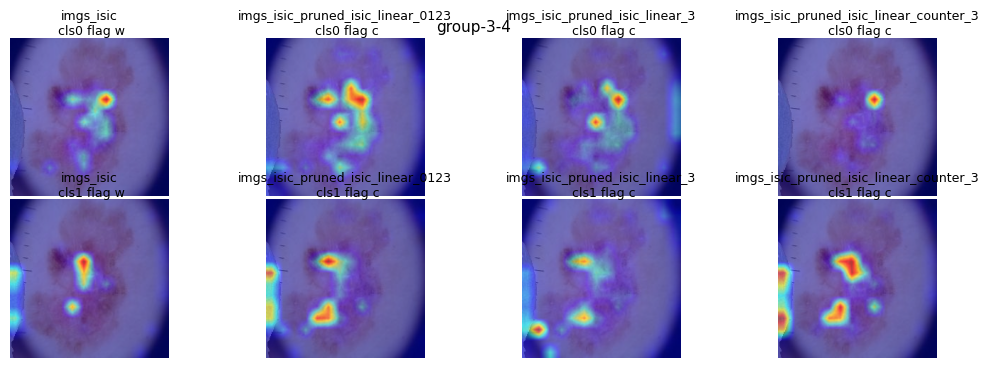

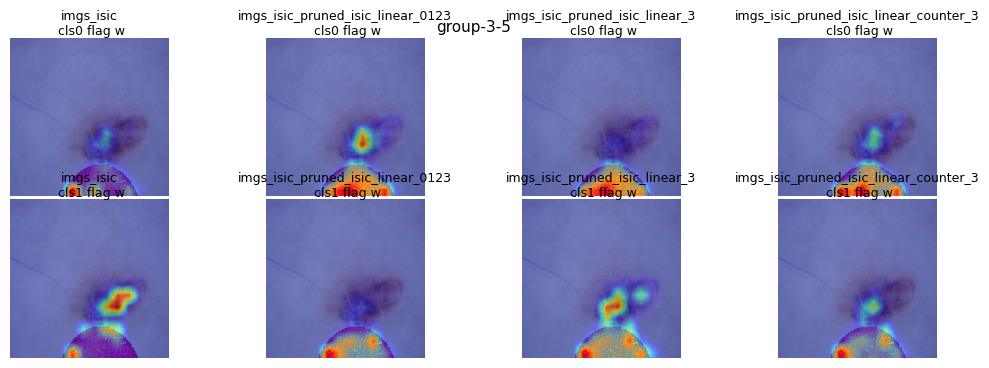

...

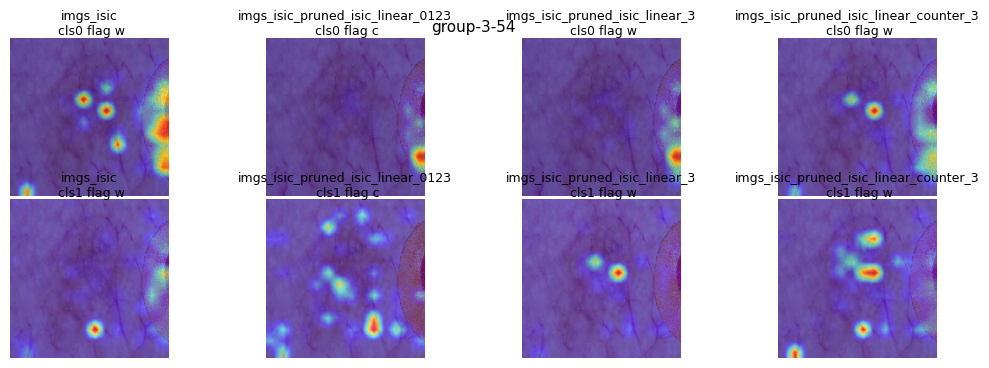

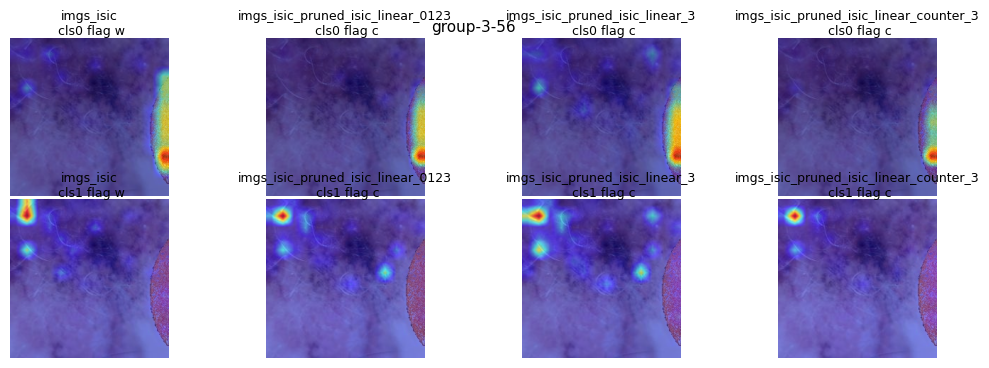

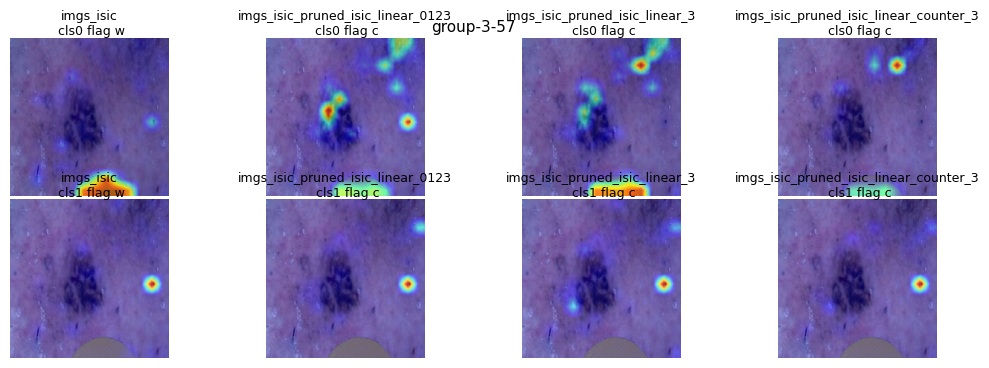

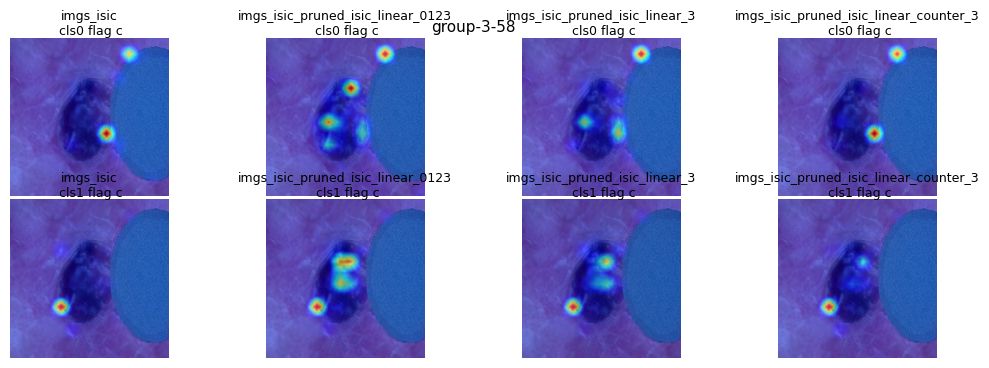

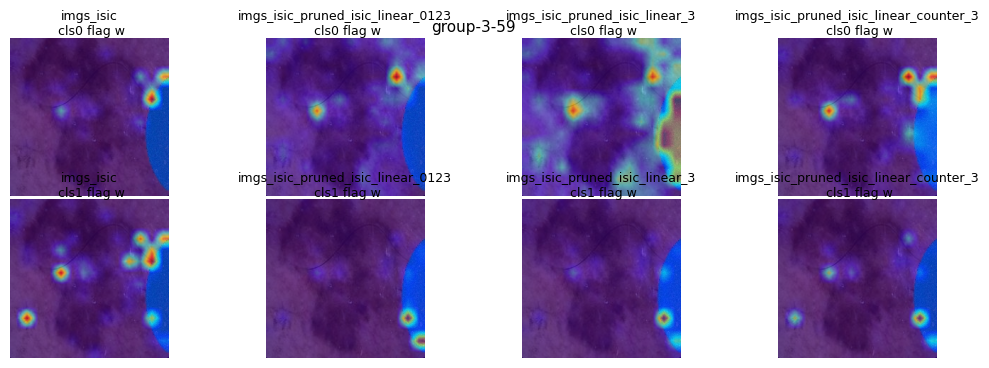

In [4]:

# --- Run the viewer

# If you want to save montages, set SAVE_FIGS=True in the config cell above.
if SAVE_FIGS and OUTPUT_DIR:
    os.makedirs(OUTPUT_DIR, exist_ok=True)

# If you want to only include some IDs, set INCLUDE_IDS = ["1047", "2031"] above.
run_viewer(BASE_DIR, FOLDERS, GROUP,
           include_ids=INCLUDE_IDS,
           limit=LIMIT,
           save_figs=SAVE_FIGS,
           output_dir=OUTPUT_DIR,
           save_dpi=SAVE_DPI)
